In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns




from gensim.models import Phrases, Word2Vec
from gensim.models.phrases import Phraser
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from nltk.corpus import stopwords, wordnet
from nltk.tokenize import word_tokenize
from nltk import pos_tag
from sklearn.metrics import  silhouette_score


from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster import KElbowVisualizer


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container {width:100% !important; }<style>"))

In [3]:
df = pd.read_csv('jobs.csv')
df.drop_duplicates(inplace = True)
df.drop('Company name', axis = 1, inplace = True)
df.rename(columns = {'Job title': 'job_title', 'Content': 'content'}, inplace = True )
df = df.dropna(subset=['content'])
df.head()

,job_title,content
0,Project Manager,About Tetra Pak: Tetra Pak is the world's lead...
1,(Sr) Associate Regulatory Affairs,(Sr) Associate Regulatory AffairsJob Descripti...
2,Freelance Instructor for Air Traffic Controlle...,Freelance Instructor for Air Traffic Controlle...
3,Fachmann-/Frau Instandhaltung (m/w/d) 80-100%,<p></p><h2>Fachmann-/Frau Instandhaltung (m/w/...
4,Deputy Chief Compliance Officer/ Regulatory Co...,<p><p>Banque Internationale à Luxembourg (Suis...


In [4]:
df.shape

(94455, 2)

In [5]:
#convert both columns to lowercase
for col in list(df):
    df[col] = df[col].str.lower()   
   

In [6]:
df.head(2) 

,job_title,content
0,project manager,about tetra pak: tetra pak is the world's lead...
1,(sr) associate regulatory affairs,(sr) associate regulatory affairsjob descripti...


In [7]:
# keeping the most common job titles
mask = df['job_title'].map(df['job_title'].value_counts()) >= 5
df = df[mask]

In [8]:
df.shape

(9456, 2)

In [9]:
stop_words = set(stopwords.words('english'))

def process_content(text):  
    tokens = word_tokenize(text)  # Try to tokenize
    words = [word for word in tokens if word.isalpha() and word not in stop_words and len(word) > 1]  # Remove punctuation, stopwords, and short words
    return words


def process_job_titles(text):    
    tokens = word_tokenize(text)    
    words = [word for word in tokens if word.isalpha()]
    # Join words
    job = ' '.join(words)
    return job

In [10]:
df['content'] = df['content'].apply(lambda x: process_content(x))
df['job_title'] = df['job_title'].apply(lambda x: process_job_titles(x))
df.head()

,job_title,content
0,project manager,"[tetra, pak, tetra, pak, world, leading, food,..."
10,marketing analyst,"[marketing, analystmarketing, analyst, locatio..."
11,compliance officer,"[compliance, officer, field, responsibility, b..."
12,data manager,"[data, manager, looking, next, challenge, exci..."
17,senior consultant enterprise applications sap,"[join, kpmg, become, part, international, succ..."


In [11]:
input_data = [[job] + content for job, content in zip(df.job_title.values, df.content.values)]
input_data

[['project manager',
  'tetra',
  'pak',
  'tetra',
  'pak',
  'world',
  'leading',
  'food',
  'processing',
  'packaging',
  'solutions',
  'company',
  'working',
  'closely',
  'customers',
  'suppliers',
  'provide',
  'safe',
  'innovative',
  'environmentally',
  'sound',
  'products',
  'day',
  'meet',
  'needs',
  'hundreds',
  'millions',
  'people',
  'countries',
  'around',
  'world',
  'employees',
  'based',
  'countries',
  'believe',
  'responsible',
  'industry',
  'leadership',
  'sustainable',
  'approach',
  'business',
  'motto',
  'protects',
  'good',
  'reflects',
  'vision',
  'make',
  'food',
  'safe',
  'available',
  'information',
  'tetra',
  'pak',
  'available',
  'business',
  'overview',
  'tetra',
  'pak',
  'zofingen',
  'works',
  'customers',
  'provide',
  'preferred',
  'processing',
  'solutions',
  'sales',
  'service',
  'beverage',
  'industry',
  'apply',
  'commitment',
  'innovation',
  'understanding',
  'consumer',
  'needs',
  'rela

In [12]:
model = Word2Vec(input_data, vector_size=50, window=5, min_count=5, workers=4, sample=1e-3, sg=1, negative=5)

In [13]:
model.wv.most_similar(['data scientist'], topn=5)


[('scientistdata', 0.8876771330833435),
 ('scientist', 0.8550155758857727),
 ('senior data scientist', 0.8436253666877747),
 ('data analyst', 0.8369045853614807),
 ('data manager', 0.8335345983505249)]

In [14]:
model.wv.most_similar(['python'], topn=5)

[('numpy', 0.9041661024093628),
 ('scala', 0.9029700756072998),
 ('ruby', 0.9026155471801758),
 ('gams', 0.892175555229187),
 ('pandas', 0.8914471864700317)]

In [15]:
model.wv.similarity(w1='data scientist', w2='data analyst')

0.8369045

In [16]:
model.wv.similarity(w1='data scientist', w2='consultant')

0.4768647

In [17]:
# create the job title vectors
word_vectors = [model.wv[job] for job in df['job_title'].values]

X = pd.DataFrame(word_vectors,
                index=df['job_title'].values, #  we place job_title at the index so we know which vector refers to which job title
                columns=['feat_'+str(i) for i in range(50)])

X.head()

,feat_0,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,...,feat_40,feat_41,feat_42,feat_43,feat_44,feat_45,feat_46,feat_47,feat_48,feat_49
project manager,0.592395,0.466009,-0.508563,0.364288,-0.230609,0.092748,0.705197,0.735756,0.461643,0.179106,...,0.886264,-0.070234,-0.249980,0.127260,0.255044,0.336928,-0.142637,-0.918168,0.206310,0.536731
marketing analyst,-0.000289,0.000369,-0.077663,0.092806,0.026421,-0.109866,0.172772,0.487929,-0.053313,-0.098028,...,0.347354,-0.073535,-0.039699,0.058647,0.166814,0.175235,0.007524,-0.255954,0.080243,0.047208
compliance officer,-0.316506,0.178203,-0.007517,0.457419,0.894349,0.014441,0.533959,0.539275,0.001713,-0.165675,...,0.774569,-0.103703,-0.058041,0.524023,0.263281,-0.069443,-0.249987,-0.965518,-0.389532,0.541403
data manager,-0.291845,0.175114,-0.311823,0.254844,0.029737,-0.114140,0.583187,0.413870,-0.009640,-0.010851,...,0.477950,-0.110210,0.351376,-0.182700,0.263633,0.307235,0.020671,-0.451196,-0.098328,-0.044509
senior consultant enterprise applications sap,-0.076455,0.077728,-0.278710,0.074464,0.071387,-0.188221,0.338236,0.645397,-0.172176,-0.080526,...,0.418464,0.068516,0.018186,0.025828,0.227962,0.179945,-0.204281,-0.341819,0.269186,-0.118532


2
3
4
5
6
7
8
9


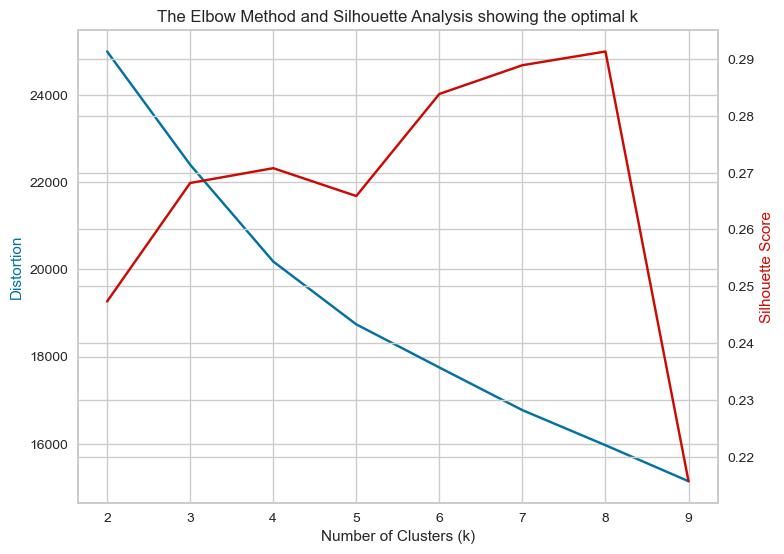

In [18]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

distortions = []
sil_scores = []
K = range(2, 10) 


for k in K:
    print(k)
    kmeanModel = KMeans(n_clusters=k, n_init=100,random_state=7)
    kmeanModel.fit(X)
    distortions.append(kmeanModel.inertia_)
    labels = kmeanModel.labels_
    sil_scores.append(silhouette_score(X, labels, metric = 'euclidean'))

fig, ax1 = plt.subplots()

ax1.set_xlabel('Number of Clusters (k)')
ax1.set_ylabel('Distortion', color='b')
ax1.plot(K, distortions, 'bx-')
ax1.tick_params(axis='y')

ax2 = ax1.twinx()  

ax2.set_ylabel('Silhouette Score', color='r')
ax2.plot(K, sil_scores, 'rx-')
ax2.tick_params(axis='y')

fig.tight_layout()
plt.title('The Elbow Method and Silhouette Analysis showing the optimal k')
plt.show()

In [19]:
kmeans = KMeans(n_clusters=4,n_init=100, random_state=2).fit(X)
# Get cluster labels
cluster_labels = kmeans.labels_

# Create DataFrame with the features and labels
df_ = pd.DataFrame(data=X, columns=[f'feat_{i}' for i in range(X.shape[1])])
df_['Cluster'] = cluster_labels


df_.head()

,feat_0,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,...,feat_41,feat_42,feat_43,feat_44,feat_45,feat_46,feat_47,feat_48,feat_49,Cluster
project manager,0.592395,0.466009,-0.508563,0.364288,-0.230609,0.092748,0.705197,0.735756,0.461643,0.179106,...,-0.070234,-0.249980,0.127260,0.255044,0.336928,-0.142637,-0.918168,0.206310,0.536731,1
marketing analyst,-0.000289,0.000369,-0.077663,0.092806,0.026421,-0.109866,0.172772,0.487929,-0.053313,-0.098028,...,-0.073535,-0.039699,0.058647,0.166814,0.175235,0.007524,-0.255954,0.080243,0.047208,2
compliance officer,-0.316506,0.178203,-0.007517,0.457419,0.894349,0.014441,0.533959,0.539275,0.001713,-0.165675,...,-0.103703,-0.058041,0.524023,0.263281,-0.069443,-0.249987,-0.965518,-0.389532,0.541403,1
data manager,-0.291845,0.175114,-0.311823,0.254844,0.029737,-0.114140,0.583187,0.413870,-0.009640,-0.010851,...,-0.110210,0.351376,-0.182700,0.263633,0.307235,0.020671,-0.451196,-0.098328,-0.044509,2
senior consultant enterprise applications sap,-0.076455,0.077728,-0.278710,0.074464,0.071387,-0.188221,0.338236,0.645397,-0.172176,-0.080526,...,0.068516,0.018186,0.025828,0.227962,0.179945,-0.204281,-0.341819,0.269186,-0.118532,2


In [20]:
tsne = TSNE(n_components=2, random_state=7)
tsne_result = tsne.fit_transform(X)

# Create a DataFrame with t-SNE coordinates
tsne_df = pd.DataFrame(tsne_result, columns=['col_0', 'col_1'])

#resulting DataFrame
tsne_df.head()

,col_0,col_1
0,46.655418,69.067329
1,-50.854412,-11.566089
2,107.635201,-6.366283
3,5.060184,74.447395
4,27.068342,-0.144554


In [21]:
tsne_df['Cluster'] = kmeans.labels_

In [22]:
tsne_df['Title'] = X.index

In [23]:
tsne_df

,col_0,col_1,Cluster,Title
0,46.655418,69.067329,1,project manager
1,-50.854412,-11.566089,2,marketing analyst
2,107.635201,-6.366283,1,compliance officer
3,5.060184,74.447395,2,data manager
4,27.068342,-0.144554,2,senior consultant enterprise applications sap
...,...,...,...,...
9451,-128.862930,102.946907,0,human rights officer temporary job opening tem...
9452,21.197319,109.761497,2,recruiter
9453,71.754028,-99.034264,1,senior developer
9454,-32.705334,-105.612144,2,electronic engineer


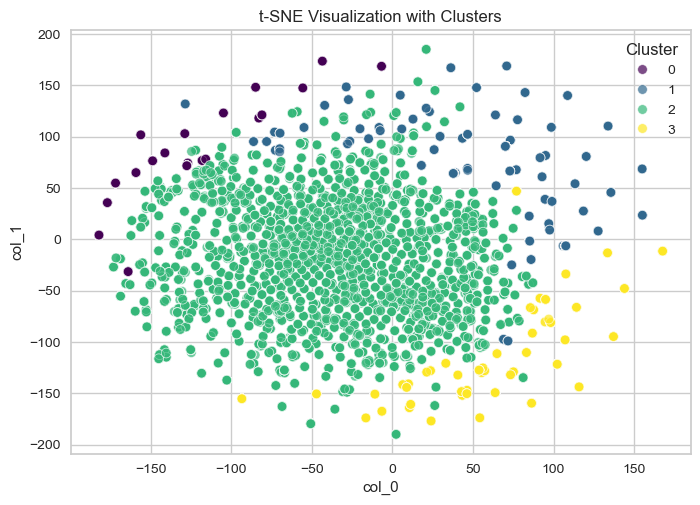

In [24]:
sns.scatterplot(x='col_0', y='col_1', hue='Cluster', data=tsne_df, palette='viridis', alpha=0.7)

# Set plot title
plt.title('t-SNE Visualization with Clusters')

# Show the plot
plt.show()

In [25]:
import plotly.graph_objects as go



fig = go.Figure()

for cluster_label in tsne_df['Cluster'].unique():
    cluster_data = tsne_df[tsne_df['Cluster'] == cluster_label]
    fig.add_trace(go.Scatter(
        x=cluster_data['col_0'],
        y=cluster_data['col_1'],
        mode='markers',
        name=f'Cluster {cluster_label}',
        marker=dict(
            size=8,
            opacity=0.7,
            colorscale='Viridis'
        ),
        text=cluster_data['Title']
    ))

# Set plot layout
fig.update_layout(
    title='t-SNE Scatter Plot with Clusters',
    xaxis=dict(title='col_0'),
    yaxis=dict(title='col_1'),
    showlegend=True
)

# Show the plot
fig.show()
